Ce notebook utilise des données prétraitées afin d'entraîner et de sélectionner un modèle qui gère les données déséquilibrées pour la prédiction. Donc, on va procéder ici à un :
- Overview imbalanced data
- Stratified split for tests
- Overview of different imbalance management methods (Undersampling, SMOTE, Sample Weights, Proba Threshold Management)
- Model Interpretability with SHAP

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pickle
import time
import shap

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold, StratifiedKFold
from bayes_opt import BayesianOptimization


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV,ParameterGrid, cross_validate

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import fbeta_score,roc_auc_score,confusion_matrix,recall_score,precision_score,accuracy_score

In [2]:
# Options de Réglages sur l'Organisation, l'Affichage Qualitatif des Données
pd.set_option("display.max.columns", None) # Pour afficher toutes les colonnes
pd.set_option('display.max_rows', None) # Pour afficher toutes les lignes
pd.set_option("max_colwidth", 40) # Pour afficher les colonnes jusqu'à une largeur maxi
pd.set_option("precision", 4) # Pour afficher seulement n chiffres après la virgule*
pd.options.display.float_format = '{:.2f}'.format # Pour remplacer l'affichage scientifique des nombres en décimal
pd.options.mode.chained_assignment = None  # default='warn'

In [3]:
data_0 = pd.read_csv('../P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry/Projet+Mise+en+prod+-+home-credit-default-risk/application_train.csv')

In [4]:
data_0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,nan,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,-1134.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,nan,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.31,0.62,nan,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,0.09,0.05,0.99,0.80,0.05,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.00,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.01,reg oper account,block of flats,0.07,Block,No,1.00,0.00,1.00,0.00,-828.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,nan,0.56,0.73,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,NaN,nan,NaN,NaN,0.00,0.00,0.00,0.00,-815.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.0

In [5]:
data_0.shape

(307511, 122)

In [6]:
data_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [7]:
data_0.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Dtype  
---  ------                        -----  
 0   SK_ID_CURR                    int64  
 1   TARGET                        int64  
 2   NAME_CONTRACT_TYPE            object 
 3   CODE_GENDER                   object 
 4   FLAG_OWN_CAR                  object 
 5   FLAG_OWN_REALTY               object 
 6   CNT_CHILDREN                  int64  
 7   AMT_INCOME_TOTAL              float64
 8   AMT_CREDIT                    float64
 9   AMT_ANNUITY                   float64
 10  AMT_GOODS_PRICE               float64
 11  NAME_TYPE_SUITE               object 
 12  NAME_INCOME_TYPE              object 
 13  NAME_EDUCATION_TYPE           object 
 14  NAME_FAMILY_STATUS            object 
 15  NAME_HOUSING_TYPE             object 
 16  REGION_POPULATION_RELATIVE    float64
 17  DAYS_BIRTH                    int64  
 18  DAYS_EMPLOYED          

In [8]:
data_0.shape

(307511, 122)

<AxesSubplot:title={'center':'Distibution of '}, ylabel='Frequency'>

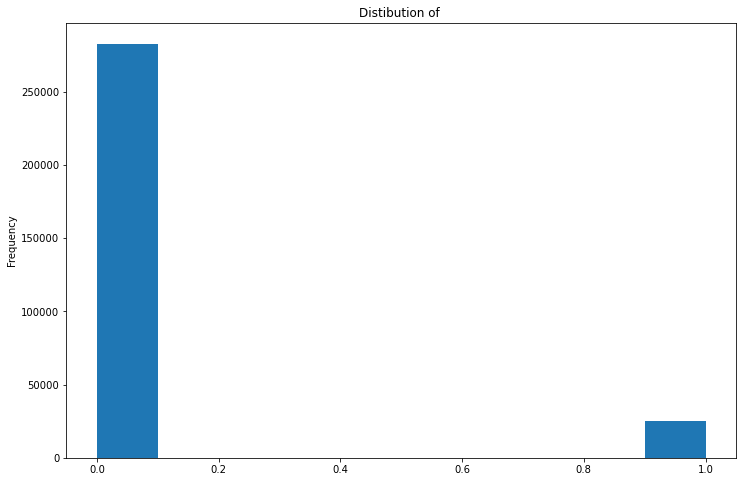

In [9]:
plt.figure(figsize=(12,8))
plt.title('Distibution of ')

data_0['TARGET'].astype(int).plot.hist()

In [10]:
pie_data_0 = pd.DataFrame(data_0['TARGET'].value_counts())
pie_data_0

,TARGET
0,282686
1,24825


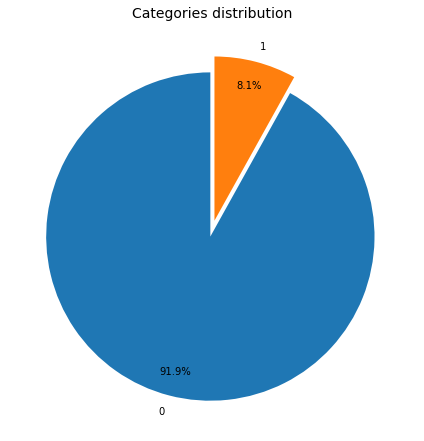

In [11]:
labels = pie_data_0.index
sizes = pie_data_0.TARGET
#explosion
explode = [0.05]*pie_data_0.shape[0]
plt.figure(figsize=[10,6])
plt.pie(sizes,labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
plt.tight_layout()
plt.title('Categories distribution',fontsize=14)
plt.show()

# Reprenons les Data pré-taitées

In [12]:
# train_data_final.pkl

with open('train_data_final.pkl', 'rb') as f:
    train_data_final = pickle.load(f)

In [13]:
train_data_final.head()

SK_ID_CURR  TARGET  CNT_CHILDREN  AMT_INCOME_TOTAL  AMT_CREDIT  \
0      100002       1             0         202500.00   406597.50   
1      100003       0             0         270000.00  1293502.50   
2      100004       0             0          67500.00   135000.00   
3      100006       0             0         135000.00   312682.50   
4      100007       0             0         121500.00   513000.00   

   AMT_ANNUITY  AMT_GOODS_PRICE  REGION_POPULATION_RELATIVE  DAYS_BIRTH  \
0     24700.50        351000.00                        0.02       25.92   
1     35698.50       1129500.00                        0.00       45.94   
2      6750.00        135000.00                        0.01       52.19   
3     29686.50        297000.00                        0.01       52.06   
4     21865.50        513000.00                        0.03       54.59   

   DAYS_EMPLOYED  DAYS_REGISTRATION  DAYS_ID_PUBLISH  OWN_CAR_AGE  FLAG_MOBIL  \
0        -637.00           -3648.00            -2120          nan           1   
1       -1188.00           -1186.00             -291          nan           1   
2        -225.00           -4260.00            -2531        26.00           1   
3       -3040.00           -9832.00            -2437          nan           1   
4       -3038.00           -4312.00            -3458          nan           1   

   FLAG_EMP_PHONE  FLAG_WORK_PHONE  FLAG_CONT_MOBILE  FLAG_PHONE  FLAG_EMAIL  \
0               1                0                 1           1           0   
1               1                0                 1           1           0   
2               1                1                 1           1           0   
3               1                0                 1           0           0   
4               1                0                 1           0           0   

   CNT_FAM_MEMBERS  HOUR_APPR_PROCESS_START  REG_REGION_NOT_LIVE_REGION  \
0             1.00                       10                           0   
1             2.00                       11                           0   
2             1.00                        9                           0   
3             2.00                       17                           0   
4             1.00                       11                           0   

   REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION  \
0                           0                            0   
1                           0                            0   
2                           0                            0   
3                           0                            0   
4                           0                            0   

   REG_CITY_NOT_LIVE_CITY  REG_CITY_NOT_WORK_CITY  LIVE_CITY_NOT_WORK_CITY  \
0                       0                       0                        0   
1                       0                       0                        0   
2                       0                       0                        0   
3                       0                       0                        0   
4                       0                       1                        1   

   EXT_SOURCE_1  EXT_SOURCE_2  EXT_SOURCE_3  APARTMENTS_AVG  BASEMENTAREA_AVG  \
0          0.08          0.26          0.14            0.02              0.04   
1          0.31          0.62          0.50            0.10              0.05   
2          0.62          0.56          0.73             nan               nan   
3          0.61          0.65          0.52             nan               nan   
4          0.65          0.32          0.54             nan               nan   

   YEARS_BEGINEXPLUATATION_AVG  YEARS_BUILD_AVG  COMMONAREA_AVG  \
0                         0.97             0.62            0.01   
1                         0.98             0.80            0.06   
2                          nan              nan             nan   
3                          nan              nan             nan   
4                          nan              nan       

In [14]:
train_data_final.shape

(10000, 1622)

In [15]:
column_names = [
    'SK_ID_CURR',
    'TARGET',
    'CNT_CHILDREN',
    'AMT_INCOME_TOTAL',
    'AMT_CREDIT',
    'AMT_ANNUITY',
    'REGION_POPULATION_RELATIVE',
    'DAYS_BIRTH',
    'DAYS_REGISTRATION',
    'DAYS_ID_PUBLISH',
    'FLAG_MOBIL',
    'FLAG_EMP_PHONE',
    'FLAG_WORK_PHONE',
    'FLAG_CONT_MOBILE',
    'FLAG_PHONE',
    'FLAG_EMAIL',
    'CNT_FAM_MEMBERS',
    'HOUR_APPR_PROCESS_START',
    'REG_REGION_NOT_LIVE_REGION',
    'REG_REGION_NOT_WORK_REGION',
    'LIVE_REGION_NOT_WORK_REGION',
    'REG_CITY_NOT_LIVE_CITY',
    'REG_CITY_NOT_WORK_CITY',
    'LIVE_CITY_NOT_WORK_CITY',
    'EXT_SOURCE_1',
    'EXT_SOURCE_2',
    'EXT_SOURCE_3',
    'DAYS_LAST_PHONE_CHANGE']

In [16]:
train_data = train_data_final[column_names]
train_data.shape

(10000, 28)

In [17]:
train_data.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE
0,100002,1,0,202500.00,406597.50,24700.50,0.02,25.92,-3648.00,-2120,1,1,0,1,1,0,1.00,10,0,0,0,0,0,0,0.08,0.26,0.14,-1134.00
1,100003,0,0,270000.00,1293502.50,35698.50,0.00,45.94,-1186.00,-291,1,1,0,1,1,0,2.00,11,0,0,0,0,0,0,0.31,0.62,0.50,-828.00
2,100004,0,0,67500.00,135000.00,6750.00,0.01,52.19,-4260.00,-2531,1,1,1,1,1,0,1.00,9,0,0,0,0,0,0,0.62,0.56,0.73,-815.00
3,100006,0,0,135000.00,312682.50,29686.50,0.01,52.06,-9832.00,-2437,1,1,0,1,0,0,2.00,17,0,0,0,0,0,0,0.61,0.65,0.52,-617.00
4,100007,0,0,121500.00,513000.00,21865.50,0.03,54.59,-4312.00,-3458,1,1,0,1,0,0,1.00,11,0,0,0,0,1,1,0.65,0.32,0.54,-1106.00


In [18]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   SK_ID_CURR                   10000 non-null  int32  
 1   TARGET                       10000 non-null  int8   
 2   CNT_CHILDREN                 10000 non-null  int8   
 3   AMT_INCOME_TOTAL             10000 non-null  float32
 4   AMT_CREDIT                   10000 non-null  float32
 5   AMT_ANNUITY                  10000 non-null  float32
 6   REGION_POPULATION_RELATIVE   10000 non-null  float16
 7   DAYS_BIRTH                   10000 non-null  float16
 8   DAYS_REGISTRATION            10000 non-null  float16
 9   DAYS_ID_PUBLISH              10000 non-null  int16  
 10  FLAG_MOBIL                   10000 non-null  int8   
 11  FLAG_EMP_PHONE               10000 non-null  int8   
 12  FLAG_WORK_PHONE              10000 non-null  int8   
 13  FLAG_CONT_MOBILE 

In [19]:
data = train_data

# Split Data


Split the data to prepare the training of our models :

Train Set -> 60% of the initial dataset to train the models
Validation Set -> 20% of the initial dataset to evaluate models score and select the best
Test Set -> 20% of the initial dataset as a final test of the selected model with unknown data

In [20]:
# Split train_test with keeping the categories distribution

train,test = train_test_split(data,
                              test_size=0.20,
                              stratify=data['TARGET'])

   TARGET
0    1845
1     155


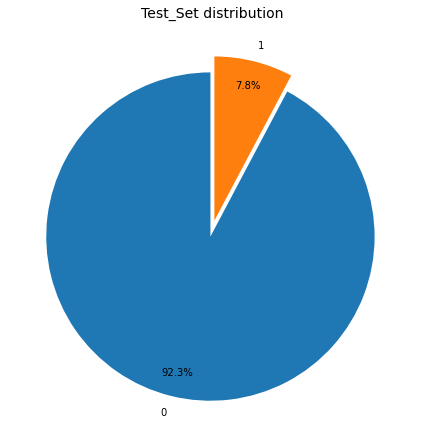

In [21]:
pie_data = pd.DataFrame(test['TARGET'].value_counts())
print(pie_data)

labels = pie_data.index
sizes = pie_data.TARGET

#explsion
explode = [0.05]*pie_data.shape[0]

plt.figure(figsize=[10,6])
plt.pie(sizes,labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)

 
plt.tight_layout()
plt.title('Test_Set distribution',fontsize=14)
plt.show()

In [116]:
test

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE
0,102827,0,450000.00,942300.00,30528.00,0.02,43.06,-9370.00,-3969,1,1,0,1,1,0,2.00,10,0,0,0,0,0,0,0.44,0.50,0.39,-8.00
1,106565,0,72000.00,246357.00,26662.50,0.02,54.30,-11630.00,-3351,1,1,1,1,0,0,2.00,9,0,0,0,0,0,0,0.56,0.46,0.40,-168.00
2,109268,1,90000.00,218016.00,14062.50,0.02,28.64,-4456.00,-2969,1,1,1,1,0,0,3.00,11,0,0,0,0,0,0,0.34,0.68,0.27,-1762.00
3,100719,0,292500.00,746280.00,59094.00,0.05,33.72,-146.00,-3807,1,1,0,1,0,0,2.00,14,0,0,0,0,0,0,0.47,0.77,0.43,-1084.00
4,100269,0,180000.00,427450.50,23319.00,0.01,30.62,-4776.00,-3699,1,1,0,1,0,0,2.00,9,0,0,0,1,1,0,0.34,0.29,0.45,-177.00
5,101489,1,180000.00,152820.00,18265.50,0.01,32.56,-4924.00,-3123,1,1,0,1,1,0,3.00,5,0,0,0,0,0,0,0.32,0.13,0.47,-344.00
6,102486,1,112500.00,364846.50,11583.00,0.01,27.78,-1518.00,-1398,1,1,0,1,0,1,3.00,15,0,0,0,1,1,0,0.19,0.38,0.47,-580.00
7,105896,0,112500.00,609898.50,39105.00,0.01,57.50,-10120.00,-4515,1,1,0,1,0,0,2.00,10,0,0,0,0,1,1,0.59,0.47,0.45,0.00
8,109691,0,202500.00,454500.00,20151.00,0.03,46.22,-2416.00,-418,1,1,0,1,0,1,1.00,10,0,0,0,0,0,0,0.35,0.36,0.49,0.00
9,102603,0,90000.00,339241.50,15943.50,0.01,24.50,-876.00,-1605,1,1,0,1,0,0,2.00,8,0,0,0,0,0,0,0.29,0.20,0.29,-604.00


In [117]:
test.shape

(2000, 27)

In [22]:
train,validation = train_test_split(train,
                                    test_size=0.25,
                                    stratify=train['TARGET'])

   TARGET
0    5535
1     465


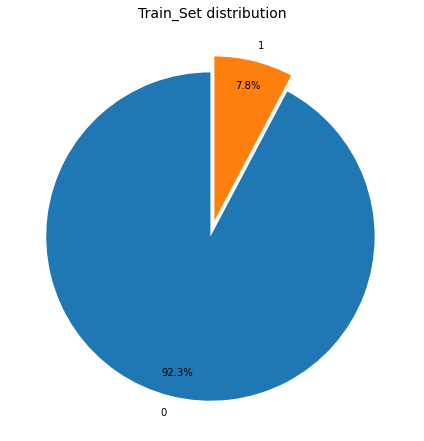

In [23]:
pie_data = pd.DataFrame(train['TARGET'].value_counts())
print(pie_data)

labels = pie_data.index
sizes = pie_data.TARGET

#explsion
explode = [0.05]*pie_data.shape[0]

plt.figure(figsize=[10,6])
plt.pie(sizes,labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)

 
plt.tight_layout()
plt.title('Train_Set distribution',fontsize=14)
plt.show()

   TARGET
0    1845
1     155


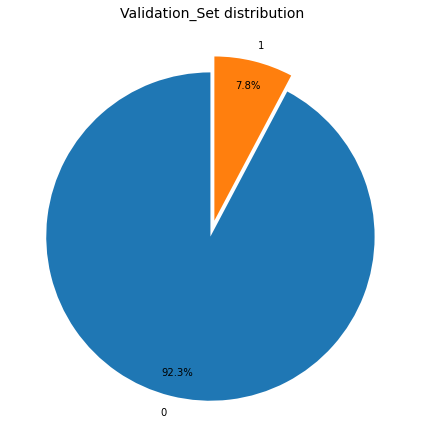

In [24]:
pie_data = pd.DataFrame(validation['TARGET'].value_counts())
print(pie_data)

labels = pie_data.index
sizes = pie_data.TARGET

#explsion
explode = [0.05]*pie_data.shape[0]

plt.figure(figsize=[10,6])
plt.pie(sizes,labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)

 
plt.tight_layout()
plt.title('Validation_Set distribution',fontsize=14)
plt.show()

In [118]:
validation

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE
7399,108626,0,1,157500.00,270000.00,13500.00,0.01,34.47,-5888.00,-4514,1,1,0,1,0,0,3.00,11,0,0,0,0,0,0,0.37,0.48,0.39,-531.00
1125,101315,0,0,99000.00,647046.00,19048.50,0.02,54.62,-3180.00,-3195,1,1,0,1,0,0,1.00,12,0,0,0,0,0,0,0.75,0.31,0.54,-2606.00
3653,104261,0,1,108000.00,679500.00,19998.00,0.03,41.34,-923.00,-144,1,1,1,1,0,0,3.00,12,0,0,0,0,1,1,0.77,0.61,0.69,-2934.00
6670,107784,0,0,202500.00,495000.00,24750.00,0.02,53.94,-1458.00,-3208,1,1,0,1,1,0,2.00,18,0,0,0,0,0,0,0.77,0.72,0.57,-536.00
9382,110909,0,1,126000.00,148365.00,12820.50,0.01,41.12,-4920.00,-4023,1,1,1,1,1,0,2.00,15,0,0,0,0,0,0,0.33,0.06,0.49,0.00
2070,102426,0,1,315000.00,215640.00,16933.50,0.05,37.22,-5864.00,-4389,1,1,0,1,1,0,3.00,11,0,0,0,0,0,0,0.67,0.71,0.61,-1136.00
5206,106092,0,0,90000.00,760225.50,32337.00,0.00,41.19,-4652.00,-5068,1,1,0,1,0,0,1.00,11,0,0,0,0,0,0,0.68,0.40,0.69,0.00
9365,110887,0,0,355500.00,1060186.50,42043.50,0.03,57.16,-9688.00,-4198,1,1,0,1,0,0,2.00,9,0,0,0,0,0,0,0.75,0.66,0.57,0.00
2597,103034,0,0,271800.00,443088.00,19647.00,0.01,49.56,-5668.00,-1637,1,0,0,1,0,0,1.00,18,0,0,0,0,0,0,0.53,0.14,0.29,0.00
4257,104981,0,2,135000.00,592560.00,30253.50,0.01,33.69,-4632.00,-3809,1,1,1,1,0,0,4.00,11,1,1,0,1,1,0,0.40,0.58,0.35,-680.00


In [119]:
validation.shape

(2000, 28)

In [25]:
train.to_csv (r'C:\Users\mina\Projets_CLASSROOMS\P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry\train2.csv', index = False, header=True)
validation.to_csv (r'C:\Users\mina\Projets_CLASSROOMS\P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry\validation2.csv', index = False, header=True)
test.to_csv (r'C:\Users\mina\Projets_CLASSROOMS\P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry\test2.csv', index = False, header=True)

# Observation SCORING

Ici, nous avons décidé d'utiliser le Fbeta Score :
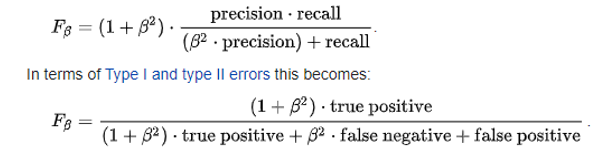
Après quelques tentatives Beta a été configuré avec la valeur 3, observons le comportement du score avec cette configuration

In [26]:
s = pd.Series([0, 1])

In [27]:
# Create a list with 50 sample of category_0 and 50 samples of category_1 
s=s.repeat(50)
s.shape

(100,)

In [28]:
s_predi = s.copy()

# Le Best Score

In [29]:
s_predi

0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
dtype: int64

C:\Users\mina\anaconda3_env\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass beta=3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Accuracy: 1.0
 Precision: 1.0
 Recall: 1.0
 Fbeta(3): 1.0



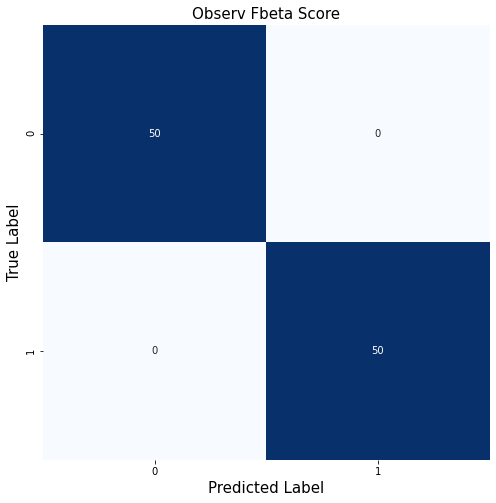

In [30]:
# Print Confusion Matrix (Perfect Score - Accuracy 100%)

accu = accuracy_score(s,s_predi)
prec = precision_score(s,s_predi)
rec = recall_score(s,s_predi)
fbeta = fbeta_score(s,s_predi,3)

print('Accuracy: {}\n Precision: {}\n Recall: {}\n Fbeta(3): {}\n'.format(accu,prec,rec,fbeta))

cm = confusion_matrix(s,
                      s_predi)

plt.figure(figsize=(8,8))
plt.title('Observ Fbeta Score',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)
plt.show()

# Réduire le score de précision

> __Observons d'abord les scores (exactitude, rappel, précision, fbeta(3)) en augmentant le FAUX POSITIF par 10__

In [31]:
s_predi_2 = s_predi.copy()
for i in range(10):
    s_predi_2.iloc[i]=1
s_predi_2

0    1
0    1
0    1
0    1
0    1
0    1
0    1
0    1
0    1
0    1
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
dtype: int64

Accuracy: 0.9
Precision: 0.8333333333333334
Recall: 1.0
Fbeta(3): 0.9803921568627452



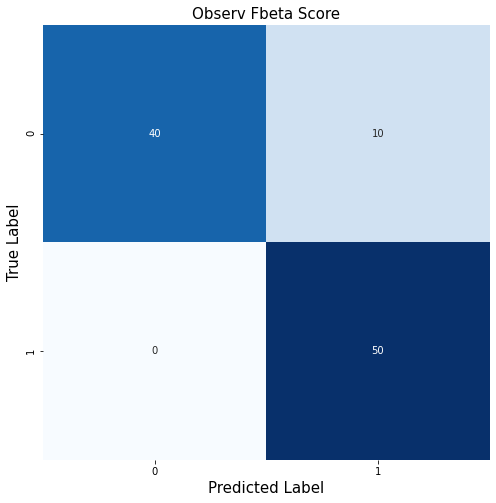

In [32]:
# Print Confusion Matrix 

accu = accuracy_score(s,s_predi_2)
prec = precision_score(s,s_predi_2)
rec = recall_score(s,s_predi_2)
fbeta = fbeta_score(s,s_predi_2,3)

print('Accuracy: {}\nPrecision: {}\nRecall: {}\nFbeta(3): {}\n'.format(accu,prec,rec,fbeta))

cm = confusion_matrix(s,
                      s_predi_2)

plt.figure(figsize=(8,8))
plt.title('Observ Fbeta Score',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)
plt.show()

> __Observons maintenant les scores (exactitude, rappel, précision, fbeta(3)) en augmentant le FAUX NÉGATIF par 10__

In [33]:
s_predi_3 = s_predi.copy()
for i in range(1,11):
    s_predi_3.iloc[-i]=0
s_predi_3

0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
0    0
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    1
1    0
1    0
1    0
1    0
1    0
1    0
1    0
1    0
1    0
1    0
dtype: int64

Accuracy: 0.9
Precision: 1.0
Recall: 0.8
Fbeta(3): 0.8163265306122448



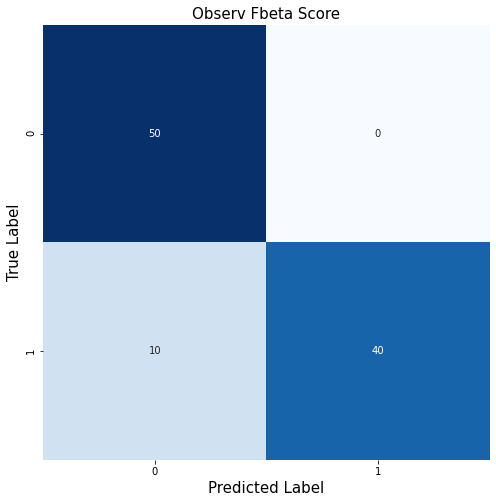

In [34]:
# Print Confusion Matrix 
s_predi_2 = s_predi_3
accu = accuracy_score(s,s_predi_2)
prec = precision_score(s,s_predi_2)
rec = recall_score(s,s_predi_2)
fbeta = fbeta_score(s,s_predi_2,3)

print('Accuracy: {}\nPrecision: {}\nRecall: {}\nFbeta(3): {}\n'.format(accu,prec,rec,fbeta))

cm = confusion_matrix(s,
                      s_predi_2)

plt.figure(figsize=(8,8))
plt.title('Observ Fbeta Score',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)
plt.show()

> __Ici, nous pouvons repérer la différence d'impact entre les faux positifs et les faux négatifs sur le score final Fbeta__

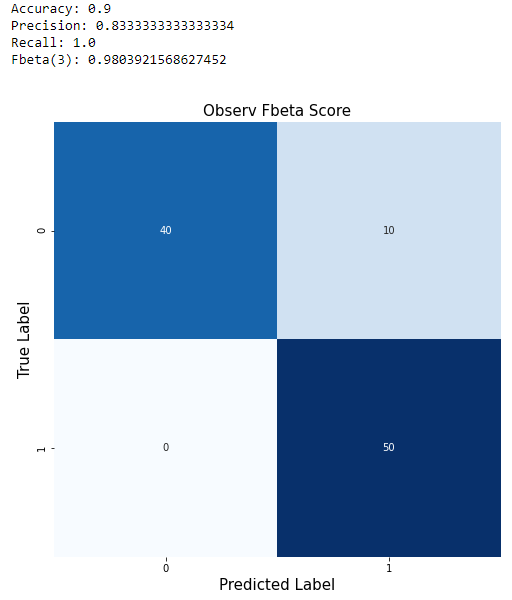
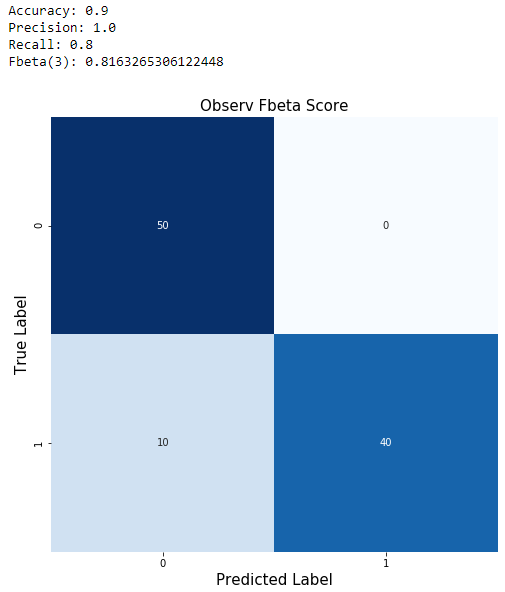

# Entrainer et sélectionner le modèle

> __Entraînons et sélectionnons quelques modèles avec différentes méthodes de gestion des déséquilibres__

In [35]:
train = pd.read_csv('train2.csv')
val = pd.read_csv('validation2.csv')
test = pd.read_csv('test2.csv')

In [36]:
y_train = np.array(train.TARGET)
train.drop(['TARGET'], axis = 1, inplace = True)
X_train = train.values

In [37]:
y_val = np.array(val.TARGET)
val.drop(['TARGET'], axis = 1, inplace = True)
X_val = val.values

In [38]:
summary_imbalance=pd.DataFrame(columns=['f_beta_score','best_param'])

In [39]:
models = {}

# Paramétrage en BASE

In [40]:
std = StandardScaler()
scaled_train = std.fit_transform(X_train)
scaled_val = std.transform(X_val)

In [41]:
parameters = {
              "min_samples_leaf":[1,3,5,7],
              "max_depth": [int(i) for i in np.linspace(5, 30, num = 4)],
              "max_features":['auto', 'sqrt']
             } 

#Create a param grid with each combination of the above declared hyperparameters
params=ParameterGrid(parameters)

import time
print('Param Optimisation start\n________________')
print('{} Steps to be done'.format(len(params)))
now = time.asctime()
print(now,'\n')

best_score = 0
best_model = None
best_params = None
best_predi = None
count=0

# Loop for each combination of parameters
for param in params:
    

    
    rdm = RandomForestClassifier(n_estimators= 200,
                                 min_samples_leaf=param['min_samples_leaf'],
                                 max_depth=param['max_depth'],
                                 max_features=param['max_features'])
    

    rdm.fit(scaled_train,y_train)
    
    y_pred = rdm.predict(scaled_val)
    
    score = fbeta_score(y_val, y_pred, beta=3)
    
    # Evaluate Fbeta score, only keeps the highest score
    
    if score > best_score:
        best_score = score
        best_model = rdm
        best_param = str(param)
        best_predi = y_pred
        
    
    if count % 10 == 0 : 
        print('Step {} done\n'.format(count))
        now = time.asctime()
        print(now,'\n')
        
    count+=1
    
    
#Write score in summary table
summary_imbalance.loc['Baseline ','f_beta_score']=best_score

#Write the string form of the best params dict
summary_imbalance.loc['Baseline ','best_param']=best_params
# summary_imbalance
models['Baseline']= best_model
predi = best_predi

Param Optimisation start
________________
32 Steps to be done
Mon Sep 13 12:31:36 2021 

Step 0 done

Mon Sep 13 12:31:38 2021 

Step 10 done

Mon Sep 13 12:31:56 2021 

Step 20 done

Mon Sep 13 12:32:21 2021 

Step 30 done

Mon Sep 13 12:32:46 2021 



Text(0.5, 51.0, 'Predicted Label')

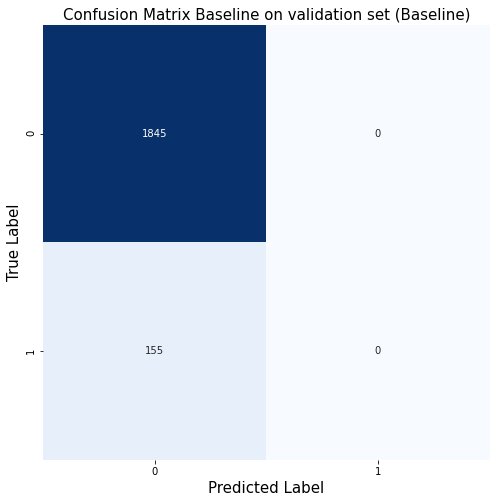

In [42]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      y_pred)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (Baseline)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

#  Paramétrage en BASE avec SEUIL (Threshold)

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'FBeta(3) score with various prediction threshold - Baseline rdm'}>

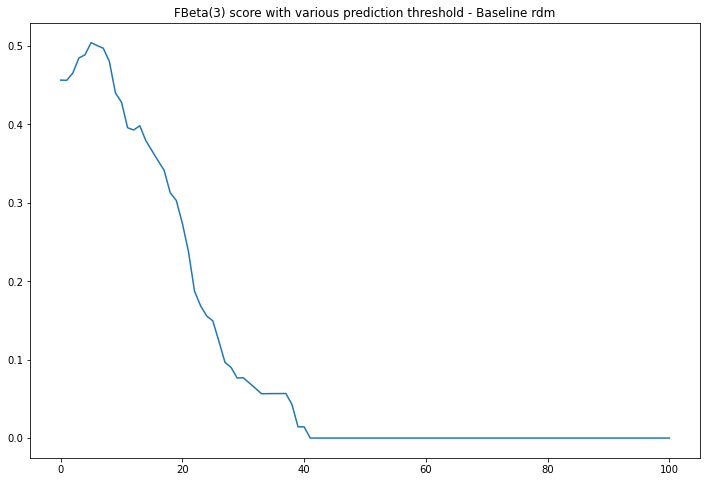

In [43]:
# Create a lineplot showing the evolution of the fbeta score 
# with changing the threshold proba for class_1

score_threshold=[]
predi = rdm.predict_proba(scaled_val)
for i in range(101):
    y_pred = (predi[:,1] >= i/100).astype(bool) # set threshold 
    score = fbeta_score(y_val, y_pred, beta=3)
    score_threshold.append(score)

plt.figure(figsize=(12,8))
plt.title('FBeta(3) score with various prediction threshold - Baseline rdm')
sns.lineplot(list(range(101)),score_threshold)

In [44]:
# Save the threshold with highest score
threshold=[i for i, j in enumerate(score_threshold) if j == max(score_threshold)][-1]/100
threshold

0.05

In [45]:
# Save prediction with the best threshold
max_predi = (rdm.predict_proba(scaled_val)[:,1] >=threshold) .astype(bool)

In [46]:
# Save score and params
summary_imbalance.loc['Baseline (Proba Threshold)','f_beta_score']=max(score_threshold)
my_param = eval(best_param)
my_param['threshold_proba']=threshold
summary_imbalance.loc['Baseline (Proba Threshold)','best_param']=str(my_param)

Text(0.5, 51.0, 'Predicted Label')

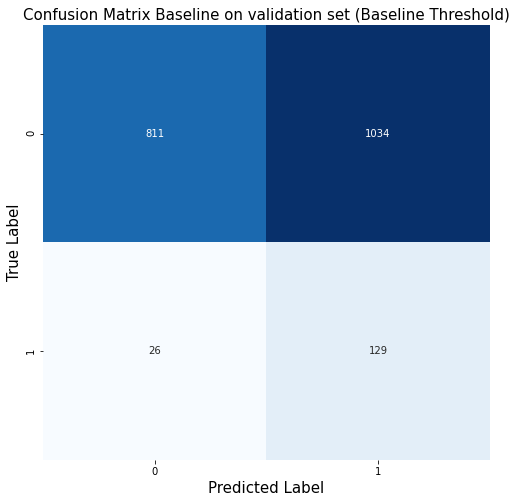

In [47]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      max_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (Baseline Threshold)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

In [48]:
summary_imbalance

,f_beta_score,best_param
Baseline,0.01,None
Baseline (Proba Threshold),0.50,"{'max_depth': 21, 'max_features': 's..."


# Undersampling

In [49]:
rus = RandomUnderSampler(random_state=0)
x_under, y_under =rus.fit_sample(X_train, y_train)

In [50]:
std = StandardScaler()
scaled_train = std.fit_transform(x_under)
scaled_val = std.transform(X_val)

In [51]:
parameters = {
              "min_samples_leaf":[1,3,5,7],
              "max_depth": [int(i) for i in np.linspace(5, 30, num = 4)],
              "max_features":['auto', 'sqrt']
             } 


params=ParameterGrid(parameters)

import time
print('Param Optimisation start\n________________')
print('{} Steps to be done'.format(len(params)))
now = time.asctime()
print(now,'\n')

best_score = 0
best_model = None
best_params = None
best_predi = None
count=0

for param in params:
    

    
    rdm = RandomForestClassifier(n_estimators= 200,
                                 min_samples_leaf=param['min_samples_leaf'],
                                 max_depth=param['max_depth'],
                                 max_features=param['max_features'])
    

    rdm.fit(scaled_train,y_under)
    
    y_pred = rdm.predict(scaled_val)
    
    score = fbeta_score(y_val, y_pred , beta=3)
    
    if score > best_score:
        best_score = score
        best_model = rdm
        best_param = str(param)
        best_predi = y_pred
        
    
    if count % 10 == 0 : 
        print('Step {} done\n'.format(count))
        now = time.asctime()
        print(now,'\n')
        
    count+=1
    
    
#Write score in summary table
summary_imbalance.loc['Undersampling ','f_beta_score']=best_score

#Write the string form of the best params dict
summary_imbalance.loc['Undersampling ','best_param']=best_param
# summary_imbalance
models['Undersampling']= best_model

Param Optimisation start
________________
32 Steps to be done
Mon Sep 13 12:32:51 2021 

Step 0 done

Mon Sep 13 12:32:51 2021 

Step 10 done

Mon Sep 13 12:32:57 2021 

Step 20 done

Mon Sep 13 12:33:04 2021 

Step 30 done

Mon Sep 13 12:33:11 2021 



In [52]:
best_score

0.5024154589371982

Text(0.5, 51.0, 'Predicted Label')

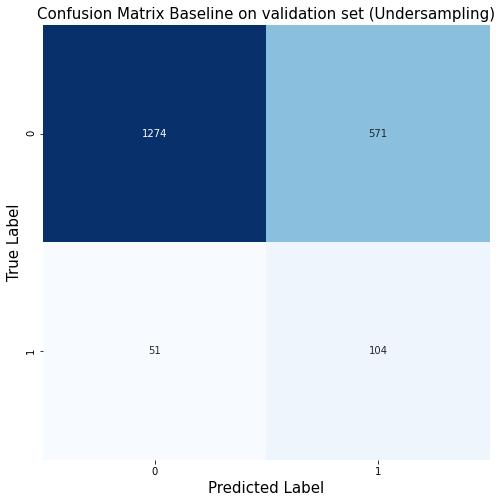

In [53]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      best_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (Undersampling)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

# Undersampling avec SEUIL (Threshold)

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'FBeta(3) score with various prediction threshold - Undersampling rdm'}>

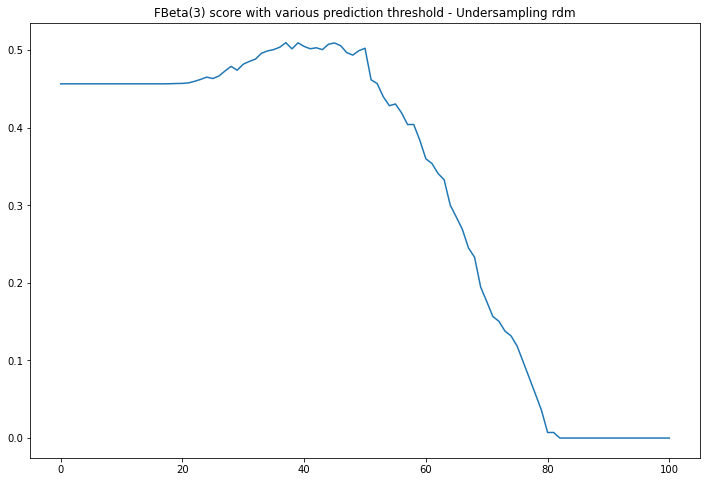

In [54]:
score_threshold=[]
predi = best_model.predict_proba(scaled_val)
for i in range(101):
    y_pred = (predi[:,1] >= i/100).astype(bool) # set threshold 
    score = fbeta_score(y_val, y_pred, beta=3)
    score_threshold.append(score)

plt.figure(figsize=(12,8))
plt.title('FBeta(3) score with various prediction threshold - Undersampling rdm')
sns.lineplot(list(range(101)),score_threshold)

In [55]:
threshold=[i for i, j in enumerate(score_threshold) if j == max(score_threshold)][-1]/100
threshold

0.37

In [56]:
max_predi = (best_model.predict_proba(scaled_val)[:,1] >=threshold) .astype(bool)

In [57]:
summary_imbalance.loc['Undersampling (Proba Threshold)','f_beta_score']=max(score_threshold)
my_param = eval(best_param)
my_param['threshold_proba']=threshold
summary_imbalance.loc['Undersampling (Proba Threshold)','best_param']=str(my_param)

Text(0.5, 51.0, 'Predicted Label')

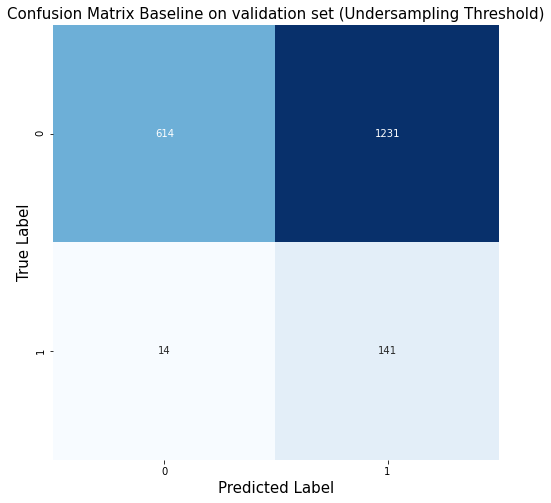

In [58]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      max_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (Undersampling Threshold)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

In [59]:
summary_imbalance

,f_beta_score,best_param
Baseline,0.01,None
Baseline (Proba Threshold),0.50,"{'max_depth': 21, 'max_features': 's..."
Undersampling,0.50,"{'max_depth': 5, 'max_features': 'au..."
Undersampling (Proba Threshold),0.51,"{'max_depth': 5, 'max_features': 'au..."


# Méthode SMOTE

> __Observons le comportement de la méthode SMOTE avec un exemple simple__

In [60]:
sig = 4
mu1 = 10
mu2 = 30

gauss1 = pd.DataFrame(np.random.multivariate_normal((mu1,mu1),([sig,0],[0,sig]) , 10000), columns=['D1','D2'])
gauss2 = pd.DataFrame(np.random.multivariate_normal((mu2,mu2),([sig,0],[0,sig]) , 1000), columns=['D1','D2'])

gauss1['categ']='0'
gauss2['categ']='1'

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='D1', ylabel='D2'>

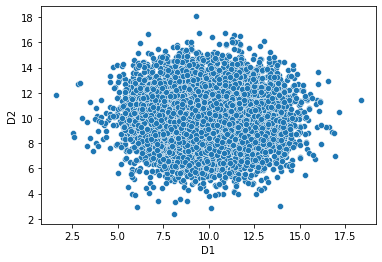

In [61]:
sns.scatterplot(gauss1.D1,gauss1.D2)

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='D1', ylabel='D2'>

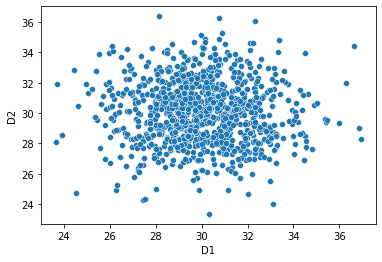

In [62]:
sns.scatterplot(gauss2.D1,gauss2.D2)

In [63]:
overview1 = gauss1.append(gauss2, ignore_index=True)
overview1

,D1,D2,categ
0,9.84,8.87,0
1,7.91,9.91,0
2,13.10,11.23,0
3,10.99,13.17,0
4,13.56,10.24,0
5,10.01,7.06,0
6,8.86,7.85,0
7,13.13,11.75,0
8,8.89,13.14,0
9,5.75,10.58,0


In [64]:
overview1.categ.value_counts()

0    10000
1     1000
Name: categ, dtype: int64

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Overview without SMOTE'}, xlabel='D1', ylabel='D2'>

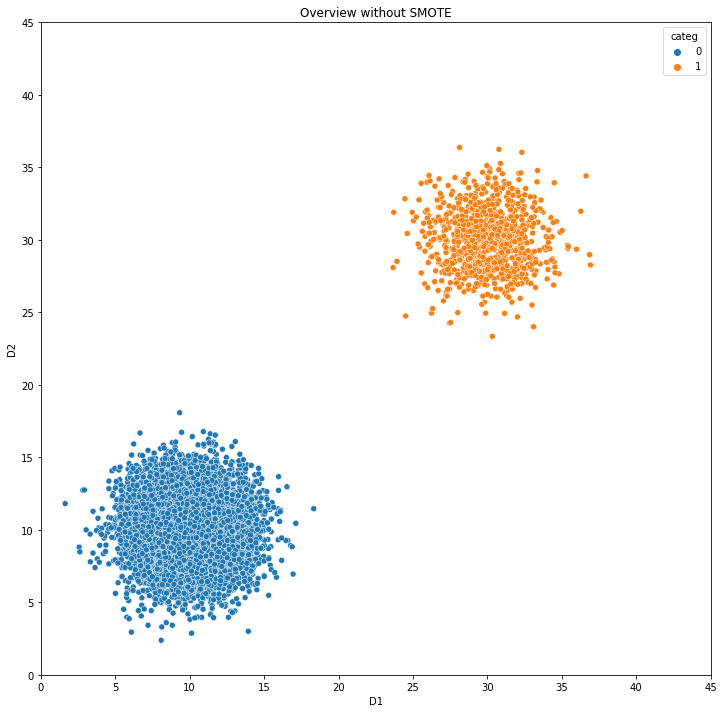

In [65]:
plt.figure(figsize=(12,12))
plt.title('Overview without SMOTE')
plt.xlim((0,45))
plt.ylim((0,45))
sns.scatterplot(overview1.D1,overview1.D2, hue=overview1.categ)

In [66]:
smote = SMOTE()

In [67]:
x_smote, y_smote = smote.fit_sample(overview1.drop(columns='categ'),overview1.categ)

In [68]:
y_smote.value_counts()

0    10000
1    10000
Name: categ, dtype: int64

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'Overview with SMOTE'}, xlabel='D1', ylabel='D2'>

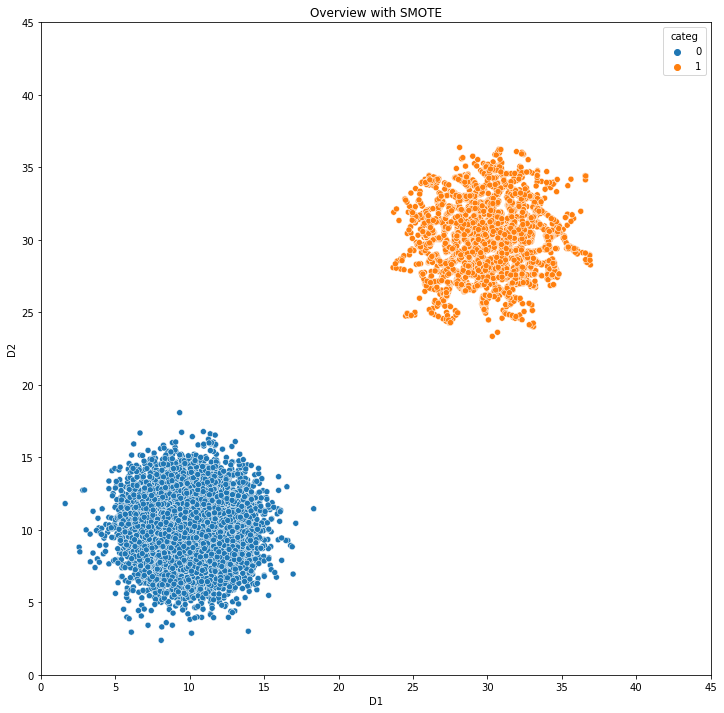

In [69]:
plt.figure(figsize=(12,12))
plt.title('Overview with SMOTE')
plt.xlim((0,45))
plt.ylim((0,45))
sns.scatterplot(x_smote.D1,x_smote.D2, hue=y_smote)

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


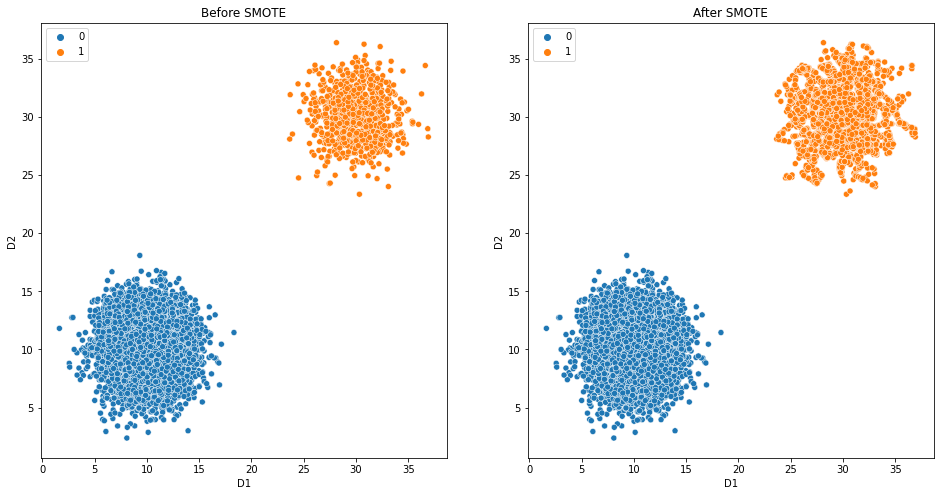

In [70]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(16,8))
ax1.set_title('Before SMOTE')
ax2.set_title('After SMOTE')
sns.scatterplot(overview1.D1,overview1.D2, hue=overview1.categ,ax=ax1)
sns.scatterplot(x_smote.D1,x_smote.D2, hue=y_smote,ax=ax2)
ax1.legend(loc=2)
ax2.legend(loc=2)

> On voit ici les limites de SMOTE : la distribution globale n'a pas été récupérée, ici les nouveaux points créés utilisent juste la distribution locale (neighbors)

## Méthode SMOTE - Paramétrage en BASE

In [71]:
smote = SMOTE(random_state = 42)
X_smote, y_smote = smote.fit_resample(X_train, y_train)

In [72]:
std = StandardScaler()
scaled_train = std.fit_transform(X_smote)
scaled_val = std.transform(X_val)

In [73]:
parameters = {
              "min_samples_leaf":[1,3,5,7],
              "max_depth": [int(i) for i in np.linspace(5, 30, num = 4)],
              "max_features":['auto', 'sqrt']
             } 


params=ParameterGrid(parameters)

import time
print('Param Optimisation start\n________________')
print('{} Steps to be done'.format(len(params)))
now = time.asctime()
print(now,'\n')

best_score = 0
best_model = None
best_params = None
best_predi = None
count=0

for param in params:
    

    
    rdm = RandomForestClassifier(n_estimators= 200,
                                 min_samples_leaf=param['min_samples_leaf'],
                                 max_depth=param['max_depth'],
                                 max_features=param['max_features'])
    

    rdm.fit(scaled_train,y_smote)
    
    y_pred = rdm.predict(scaled_val)
    
    score = fbeta_score(y_val, y_pred, beta=3)
    
    if score > best_score:
        best_score = score
        best_model = rdm
        best_param = str(param)
        best_predi = y_pred
        
    
    if count % 10 == 0 : 
        print('Step {} done\n'.format(count))
        now = time.asctime()
        print(now,'\n')
        
    count+=1
    
    
#Write score in summary table
summary_imbalance.loc['SMOTE ','f_beta_score']=best_score

#Write the string form of the best params dict
summary_imbalance.loc['SMOTE ','best_param']=best_param
# summary_imbalance
models['SMOTE']= best_model

Param Optimisation start
________________
32 Steps to be done
Mon Sep 13 12:33:21 2021 

Step 0 done

Mon Sep 13 12:33:24 2021 

Step 10 done

Mon Sep 13 12:34:00 2021 

Step 20 done

Mon Sep 13 12:34:50 2021 

Step 30 done

Mon Sep 13 12:35:40 2021 



Text(0.5, 51.0, 'Predicted Label')

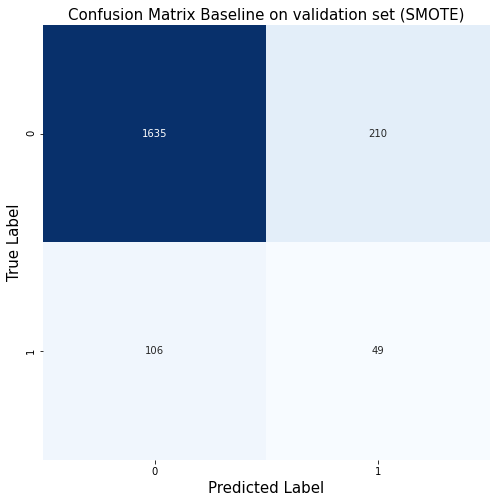

In [74]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      best_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (SMOTE)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

## Méthode SMOTE - Paramétrage en BASE avec Threshold

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'FBeta(3) score with various prediction threshold - SMOTE rdm'}>

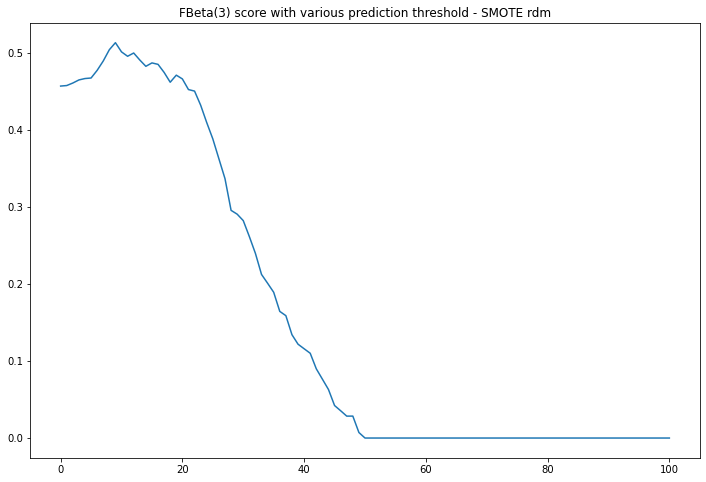

In [75]:
score_threshold=[]
predi = rdm.predict_proba(scaled_val)
for i in range(101):
    y_pred = (predi[:,1] >= i/100).astype(bool) # set threshold 
    score = fbeta_score(y_val, y_pred, beta=3)
    score_threshold.append(score)

plt.figure(figsize=(12,8))
plt.title('FBeta(3) score with various prediction threshold - SMOTE rdm')
sns.lineplot(list(range(101)),score_threshold)

In [76]:
threshold=[i for i, j in enumerate(score_threshold) if j == max(score_threshold)][-1]/100
threshold

0.09

In [77]:
max_predi = (rdm.predict_proba(scaled_val)[:,1] >=threshold) .astype(bool)

In [78]:
summary_imbalance.loc['SMOTE (Proba Threshold)','f_beta_score']=max(score_threshold)
my_param = eval(best_param)
my_param['threshold_proba']=threshold
summary_imbalance.loc['SMOTE (Proba Threshold)','best_param']=str(my_param)

Text(0.5, 51.0, 'Predicted Label')

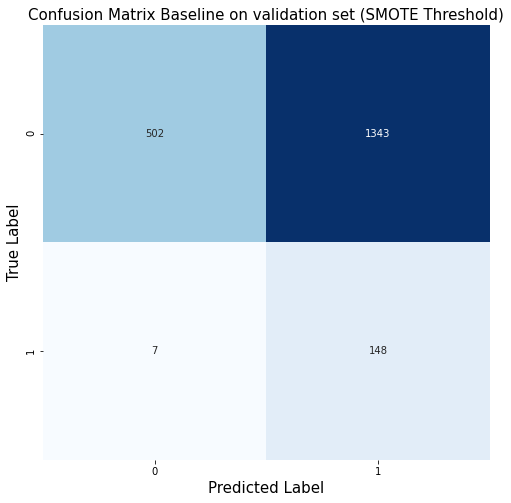

In [79]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      max_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (SMOTE Threshold)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

In [80]:
summary_imbalance

,f_beta_score,best_param
Baseline,0.01,None
Baseline (Proba Threshold),0.50,"{'max_depth': 21, 'max_features': 's..."
Undersampling,0.50,"{'max_depth': 5, 'max_features': 'au..."
Undersampling (Proba Threshold),0.51,"{'max_depth': 5, 'max_features': 'au..."
SMOTE,0.30,"{'max_depth': 5, 'max_features': 'au..."
SMOTE (Proba Threshold),0.51,"{'max_depth': 5, 'max_features': 'au..."


# Méthode Class_Weight

In [81]:
y_train

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [82]:
np.count_nonzero(y_train == 0)

5535

In [83]:
np.count_nonzero(y_train == 1)

465

In [84]:
# ratio = y_train.value_counts().values[0]/y_train.value_counts().values[1]
ratio = np.count_nonzero(y_train == 0) / np.count_nonzero(y_train == 1)
ratio 

11.903225806451612

In [85]:
std = StandardScaler()
scaled_train = std.fit_transform(X_train)
scaled_val = std.transform(X_val)

In [86]:
parameters = {
              "min_samples_leaf":[1,3,5,7],
              "max_depth": [int(i) for i in np.linspace(5, 30, num = 4)],
              "max_features":['auto', 'sqrt']
             } 



params=ParameterGrid(parameters)

import time
print('Param Optimisation start\n________________')
print('{} Steps to be done'.format(len(params)))
now = time.asctime()
print(now,'\n')

best_score = 0
best_model = None
best_params = None
best_predi = None
count=0

for param in params:
    

    
    rdm = RandomForestClassifier(n_estimators= 200,
                                 min_samples_leaf=param['min_samples_leaf'],
                                 max_depth=param['max_depth'],
                                 max_features='sqrt')
    

    sample_weights_train = y_train.copy()
    sample_weights_train = np.where(sample_weights_train== 1, ratio, 1)

    
    rdm.fit(scaled_train,y_train,sample_weight=sample_weights_train)
    
    y_pred = rdm.predict(scaled_val)
    
    score = fbeta_score(y_val, y_pred, beta=3)
    
    if score > best_score:
        best_score = score
        best_model = rdm
        best_param = str(param)
        best_predi = y_pred
        
    
    if count % 10 == 0 : 
        print('Step {} done\n'.format(count))
        now = time.asctime()
        print(now,'\n')
        
    count+=1
    
    
#Write score in summary table
summary_imbalance.loc['Class_Weight ','f_beta_score']=best_score

#Write the string form of the best params dict
summary_imbalance.loc['Class_Weight ','best_param']=best_param
# summary_imbalance
models['Class_Weight']= best_model

Param Optimisation start
________________
32 Steps to be done
Mon Sep 13 12:35:47 2021 

Step 0 done

Mon Sep 13 12:35:49 2021 

Step 10 done

Mon Sep 13 12:36:06 2021 

Step 20 done

Mon Sep 13 12:36:30 2021 

Step 30 done

Mon Sep 13 12:36:54 2021 



Text(0.5, 51.0, 'Predicted Label')

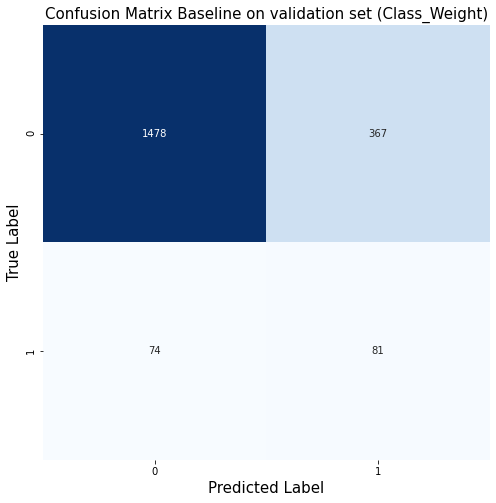

In [87]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      best_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Baseline on validation set (Class_Weight)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

## Méthode Class_Weight avec Threshold

C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'FBeta(3) score with various prediction threshold - Baseline'}>

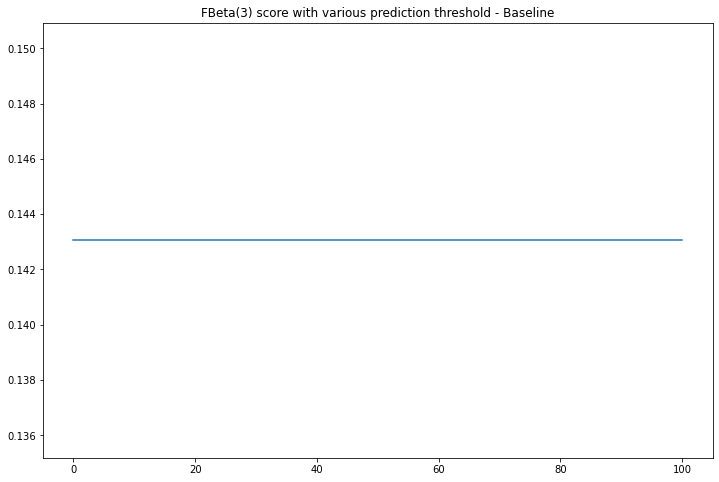

In [88]:
score_threshold=[]
predi = best_model.predict_proba(scaled_val)
for i in range(101):
    y_pred = (predi[:,1] >= i/100).astype(bool) # set threshold     score = fbeta_score(y_val, y_pred, beta=3)
    score_threshold.append(score)

plt.figure(figsize=(12,8))
plt.title('FBeta(3) score with various prediction threshold - Baseline')
sns.lineplot(list(range(101)),score_threshold)

In [89]:
threshold=[i for i, j in enumerate(score_threshold) if j == max(score_threshold)][-1]/100
print('max threshold: {}'.format(threshold))

max threshold: 1.0


In [90]:
max_predi = (best_model.predict_proba(scaled_val)[:,1] >=threshold) .astype(bool)

In [91]:
summary_imbalance.loc['Class_Weight (Proba Threshold)','f_beta_score']=max(score_threshold)
my_param = eval(best_param)
my_param['threshold_proba']=threshold
summary_imbalance.loc['Class_Weight (Proba Threshold)','best_param']=str(my_param)

In [92]:
summary_imbalance.iloc[5,1]

"{'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 7, 'threshold_proba': 0.09}"

Text(0.5, 51.0, 'Predicted Label')

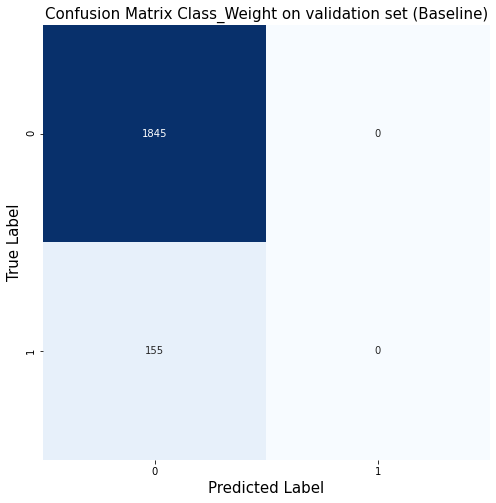

In [93]:
# Print Confusion Matrix 

cm = confusion_matrix(y_val,
                      max_predi)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Class_Weight on validation set (Baseline)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

# Résultats

In [94]:
summary_imbalance

,f_beta_score,best_param
Baseline,0.01,None
Baseline (Proba Threshold),0.50,"{'max_depth': 21, 'max_features': 's..."
Undersampling,0.50,"{'max_depth': 5, 'max_features': 'au..."
Undersampling (Proba Threshold),0.51,"{'max_depth': 5, 'max_features': 'au..."
SMOTE,0.30,"{'max_depth': 5, 'max_features': 'au..."
SMOTE (Proba Threshold),0.51,"{'max_depth': 5, 'max_features': 'au..."
Class_Weight,0.44,"{'max_depth': 5, 'max_features': 'au..."
Class_Weight (Proba Threshold),0.14,"{'max_depth': 5, 'max_features': 'au..."


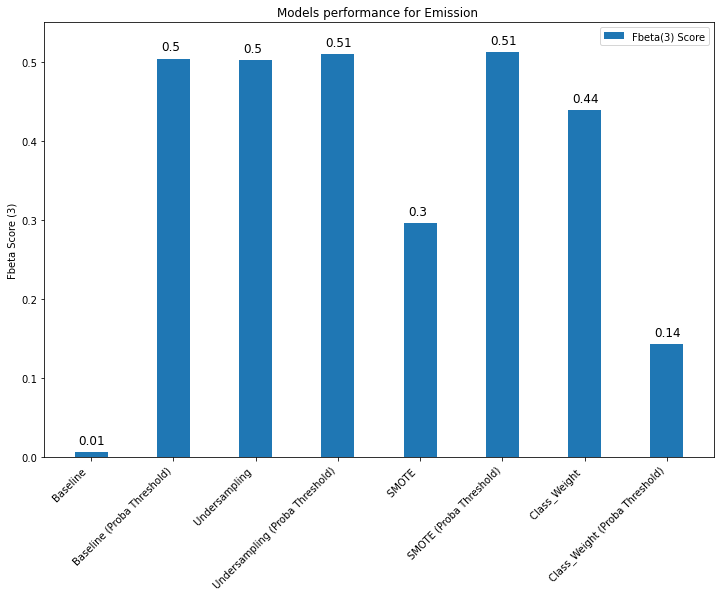

In [95]:
# Plot all the results for each methods
_X = np.arange(len(summary_imbalance.index))

fig = plt.figure(figsize=[12,8])
ax = fig.add_subplot(111)

ax.set_title('Models performance for Emission ')
ax.bar(_X,summary_imbalance['f_beta_score'], 0.4,label='Fbeta(3) Score')
ax.legend()
ax.set_xticks(_X)
# ax.set_ylim([0.3,0.8])
ax.set_xticklabels(summary_imbalance.index, rotation=45, horizontalalignment='right')
#ax.set_ylim([0.25,0.75])
ax.set_ylim([0,0.55])

for index, value in enumerate(summary_imbalance['f_beta_score']):
    val = np.around(value,2)   
    plt.text(index-0.15, value+0.01, str(val),fontsize=12)
plt.ylabel('Fbeta Score (3)')
    
plt.show()

# Test Score

> __On va ici établir le Score avec les données de test avec le meilleur modèle :__

In [96]:
y_test = np.array(test.TARGET)
test.drop(['TARGET'], axis = 1, inplace = True)
X_test = test.values

In [97]:
X_test_scale = std.transform(X_test)

In [98]:
# ici, on considère le meilleur modèle

# final_class = models['Class_Weight']
final_class = models['SMOTE']

In [99]:
summary_imbalance.iloc[[5],[1]] 

,best_param
SMOTE (Proba Threshold),"{'max_depth': 5, 'max_features': 'au..."


In [100]:
summary_imbalance.iloc[5,1]

"{'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 7, 'threshold_proba': 0.09}"

In [101]:
data = {'max_depth': 5, 'max_features': 'auto', 'min_samples_leaf': 3, 'threshold_proba': 0.16}

columns = list(data.keys())
values = list(data.values())
arr_len = len(values)

df = pd.DataFrame(np.array(values, dtype=object).reshape(1, arr_len), columns=columns)
df

,max_depth,max_features,min_samples_leaf,threshold_proba
0,5,auto,3,0.16


In [102]:
val = df.iloc[0]['threshold_proba']
val

0.16

In [103]:
#th = summary_imbalance.iloc[7,1]['proba_threshold'] # ça c'est pour le models['Class_Weight']

th = val

In [104]:
y_predi_test = (final_class.predict_proba(X_test_scale)[:,1] >=th).astype(bool)

C:\Users\mina\anaconda3_env\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass beta=3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
C:\Users\mina\anaconda3_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:title={'center':'FBeta(3) score with various prediction threshold - Test'}>

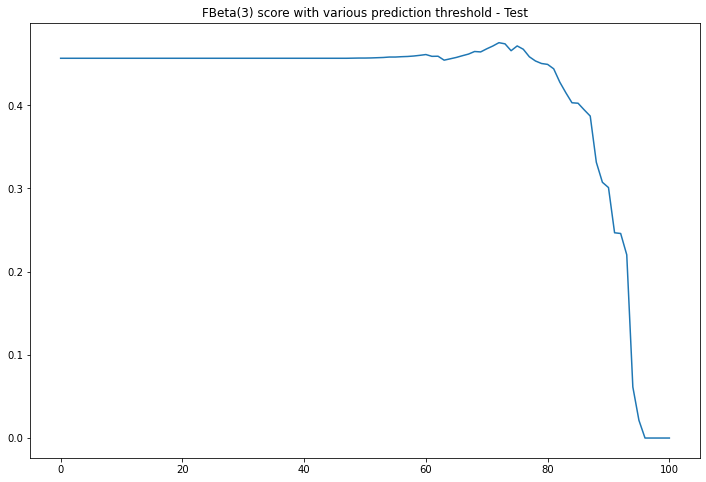

In [105]:
score_threshold=[]
predi = final_class.predict_proba(X_test_scale)
for i in range(101):
    y_pred = (predi[:,1] >= i/100).astype(bool) # set threshold     score = fbeta_score(y_val, y_pred, beta=3)
    score = fbeta_score(y_test,y_pred,3)
    score_threshold.append(score)

plt.figure(figsize=(12,8))
plt.title('FBeta(3) score with various prediction threshold - Test')
sns.lineplot(list(range(101)),score_threshold)

C:\Users\mina\anaconda3_env\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass beta=3 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


fbeta(3): 0.4565537555228277
auc score: 0.5


Text(0.5, 51.0, 'Predicted Label')

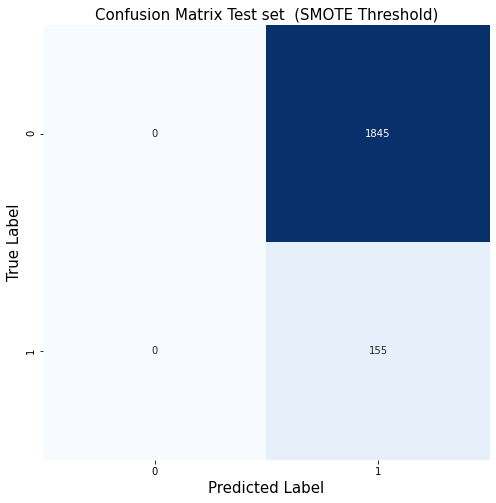

In [106]:
# Print Confusion Matrix 
fbeta= fbeta_score(y_test,y_predi_test,3)
auc= roc_auc_score(y_test,y_predi_test)
print('fbeta(3): {}\nauc score: {}'.format(fbeta,auc))

cm = confusion_matrix(y_test,
                      y_predi_test)

plt.figure(figsize=(8,8))
plt.title('Confusion Matrix Test set  (SMOTE Threshold)',fontsize=15)
f = sns.heatmap(cm,
                cmap='Blues',
                cbar=False,
                annot=True,
                fmt='g')
f.set_ylabel('True Label',fontsize=15)
f.set_xlabel('Predicted Label',fontsize=15)

# Données Ressources pour le Dashboard (sauvegarde)

## Prediction

In [107]:
with open('dashboard_resources\model.pkl', 'wb') as f:
    pickle.dump(final_class, f)

In [108]:
with open('dashboard_resources\scaler.pickle', 'wb') as f:
    pickle.dump(std, f)

In [109]:
with open(r'dashboard_resources\threshold.pickle', 'wb') as f:
    pickle.dump(th, f)

## Customer Predicted

> Créer un tableau avec la prédiction du client sur l'ensemble de données de test (pour le tableau de bord)

In [120]:
#cust_pred = pd.DataFrame(test, columns=['SK_ID_CURR','TARGET'])
cust_pred = pd.DataFrame(validation, columns=['SK_ID_CURR','TARGET'])
cust_pred['SK_ID_CURR']=cust_pred['SK_ID_CURR'].astype('int64')

In [121]:
cust_pred.TARGET.value_counts()

0    1845
1     155
Name: TARGET, dtype: int64

In [122]:
cust_pred['proba'] = final_class.predict_proba(X_test_scale)[:,1]

In [123]:
cust_pred['predict']=(cust_pred['proba']>=th).astype(int)

In [124]:
cust_pred['TARGET']=cust_pred['TARGET'].astype(int)

In [125]:
cust_pred.head(50)

,SK_ID_CURR,TARGET,proba,predict
7399,108626,0,0.94,1
1125,101315,0,0.94,1
3653,104261,0,0.82,1
6670,107784,0,0.87,1
9382,110909,0,0.81,1
2070,102426,0,0.91,1
5206,106092,0,0.77,1
9365,110887,0,0.83,1
2597,103034,0,0.94,1
4257,104981,0,0.94,1


In [126]:
cust_pred.to_csv (r'C:/Users/mina/Projets_CLASSROOMS/P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry/dashboard_resources/cust_pred.csv', index = False, header=True)

## Average values

> Créez un cadre de données avec des valeurs moyennes pour tous les clients, default_customer, non_default customer, sur chaque fonctionnalité

In [133]:
data = pd.read_csv('test2.csv')

In [134]:
average = pd.DataFrame(columns=data.columns,index = ['mean_value','non_default_customer','default_customer'])

In [135]:
average

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE
mean_value,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
non_default_customer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default_customer,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [136]:
for col in average.columns:
    average.loc['mean_value',col]=data[col].mean()
    average.loc['non_default_customer',col]=data[data['TARGET']==0][col].mean()
    average.loc['default_customer',col]=data[data['TARGET']==1][col].mean()

In [137]:
average = average.T
average

,mean_value,non_default_customer,default_customer
SK_ID_CURR,105857.09,105847.61,105969.85
TARGET,0.08,0.00,1.00
CNT_CHILDREN,0.41,0.41,0.50
AMT_INCOME_TOTAL,167636.81,167954.27,163858.06
AMT_CREDIT,584094.13,590541.41,507350.61
AMT_ANNUITY,26943.95,26979.24,26523.87
REGION_POPULATION_RELATIVE,0.02,0.02,0.02
DAYS_BIRTH,43.64,43.90,40.43
DAYS_REGISTRATION,-4896.49,-4955.72,-4191.49
DAYS_ID_PUBLISH,-2960.53,-2989.69,-2613.49


In [138]:
average.to_csv (r'C:/Users/mina/Projets_CLASSROOMS/P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry/dashboard_resources/average.csv', index = True, header=True)

# Interpretability SHAP

> Utilisez SHAP pour obtenir les fonctionnalités les plus importantes utilisées sur notre modèle

In [139]:
#import shap

In [140]:
shap.initjs()

In [167]:
#Final_RF_Model_08_2021.pkl
with open('Final_RF_Model_08_2021.pkl', 'rb') as f:
    data_final = pickle.load(f)

In [177]:
data_final

array(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE'], dtype=object)

In [143]:
scaled_val

array([[ 0.82531102,  0.82443823, -0.09938363, ..., -0.20449884,
        -0.66853015,  0.52588361],
       [-1.35585666, -0.58365439, -0.71069672, ..., -1.09375083,
         0.18133674, -1.98550329],
       [-0.47694543,  0.82443823, -0.61664855, ...,  0.48879822,
         1.01731692, -2.38248396],
       ...,
       [-0.50856953, -0.58365439,  0.37085721, ..., -0.50482107,
        -0.43689976,  0.73768732],
       [-1.49160161,  0.82443823,  0.13573679, ..., -0.4031162 ,
        -0.7013028 ,  1.04994651],
       [-0.07329069, -0.58365439, -1.0398653 , ..., -0.01333628,
         0.9734349 ,  1.16855659]])

In [178]:
#df = pd.DataFrame(data=values, columns=column_names)
dfl = pd.DataFrame(data=scaled_val, columns=data_final)
dfl

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_LAST_PHONE_CHANGE
0,0.83,0.82,-0.10,-0.82,-0.95,-1.00,-0.80,-0.25,-1.01,0.00,0.47,-0.49,0.04,-0.63,-0.25,0.93,-0.35,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,-0.93,-0.20,-0.67,0.53
1,-1.36,-0.58,-0.71,0.11,-0.56,-0.05,0.90,0.51,-0.14,0.00,0.47,-0.49,0.04,-0.63,-0.25,-1.30,-0.03,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,1.12,-1.09,0.18,-1.99
2,-0.48,0.82,-0.62,0.19,-0.49,0.30,-0.22,1.15,1.87,0.00,0.47,2.03,0.04,-0.63,-0.25,0.93,-0.03,-0.13,-0.23,-0.20,-0.30,1.80,2.14,1.23,0.49,1.02,-2.38
3,0.57,-0.58,0.37,-0.27,-0.16,0.26,0.84,1.00,-0.15,0.00,0.47,-0.49,0.04,1.59,-0.25,-0.18,1.88,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,1.28,1.09,0.34,0.52
4,1.51,0.82,-0.43,-1.12,-0.99,-0.87,-0.24,0.02,-0.69,0.00,0.47,2.03,0.04,1.59,-0.25,-0.18,0.92,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,-1.16,-2.43,-0.11,1.17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.36,-0.58,-0.71,0.18,-0.50,0.70,1.71,-1.41,-0.62,0.00,0.47,-0.49,0.04,-0.63,-0.25,-0.18,-0.35,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,1.48,0.17,1.54,-1.82
1996,0.73,-0.58,0.56,1.29,1.45,-1.32,1.59,1.27,-1.26,0.00,-2.14,-0.49,0.04,-0.63,-0.25,-0.18,-1.62,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,1.32,1.19,1.38,0.21
1997,-0.51,-0.58,0.37,0.37,0.93,-0.31,-0.72,1.26,0.61,0.00,0.47,-0.49,0.04,-0.63,-0.25,-1.30,0.29,-0.13,-0.23,-0.20,-0.30,-0.55,-0.47,0.26,-0.50,-0.44,0.74
1998,-1.49,0.82,0.14,0.27,2.05,-0.74,-1.34,0.64,1.24,0.00,0.47,-0.49,0.04,-0.63,3.99,0.93,1.24,7.84,4.40,5.04,3.36,-0.55,-0.47,-1.72,-0.40,-0.70,1.05


In [179]:
x_val_shap = dfl.copy()

In [186]:
with open('C:/Users/mina/Projets_CLASSROOMS/P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry/dashboard_resources/model.pkl', 'rb') as f:
    mod_final = pickle.load(f)

In [187]:
mod_final

RandomForestClassifier(max_depth=5, min_samples_leaf=7, n_estimators=200)

In [188]:
#explainer = shap.TreeExplainer(final_model)
explainer = shap.TreeExplainer(mod_final)
shap_values = explainer.shap_values(x_val_shap)

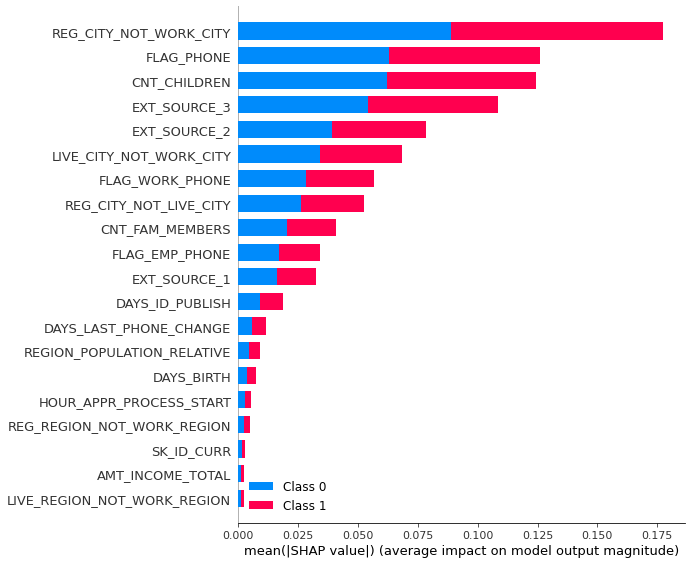

In [189]:
shap.summary_plot(shap_values,x_val_shap)

In [190]:
# To be tested
vals= np.abs(shap_values).mean(0)

feature_importance = pd.DataFrame(list(zip(x_val_shap.columns, sum(vals))), columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'], ascending=False,inplace=True)
feature_importance.head()

,col_name,feature_importance_vals
21,REG_CITY_NOT_WORK_CITY,177.59
13,FLAG_PHONE,126.17
1,CNT_CHILDREN,124.18
25,EXT_SOURCE_3,108.55
24,EXT_SOURCE_2,78.49


In [191]:
shap_features = feature_importance.col_name.values.tolist()

In [192]:
with open(r'dashboard_resources\shap_features.pickle', 'wb') as f:
    pickle.dump(shap_features, f)

In [193]:
with open(r'dashboard_resources\explainer.pickle', 'wb') as f:
    pickle.dump(explainer, f)

## View features importances

In [196]:
with open('C:/Users/mina/Projets_CLASSROOMS/P7_Pret_Credit_Conso_VERGE-DEPRE_Thierry/dashboard_resources/model.pkl', 'rb') as file:
        final_model=pickle.load(file)

In [197]:
# Create a dataframe which concatenates the feature name of the train and the coef feature attribute of our model
coef_features = final_model.feature_importances_
study_feature = pd.concat((pd.DataFrame(train.columns,columns=['Feature_name']),
                           pd.DataFrame(coef_features,columns=['Coef_feature'])),axis=1).sort_values(by='Coef_feature',ascending=False)
study_feature.head(10)

,Feature_name,Coef_feature
21,REG_CITY_NOT_WORK_CITY,0.15
25,EXT_SOURCE_3,0.13
13,FLAG_PHONE,0.12
24,EXT_SOURCE_2,0.11
1,CNT_CHILDREN,0.10
10,FLAG_EMP_PHONE,0.09
15,CNT_FAM_MEMBERS,0.06
22,LIVE_CITY_NOT_WORK_CITY,0.05
11,FLAG_WORK_PHONE,0.04
23,EXT_SOURCE_1,0.03


<AxesSubplot:title={'center':'Obersv model attribute: feature importances  (20 first features in %)'}, xlabel='Coef_feature', ylabel='Feature_name'>

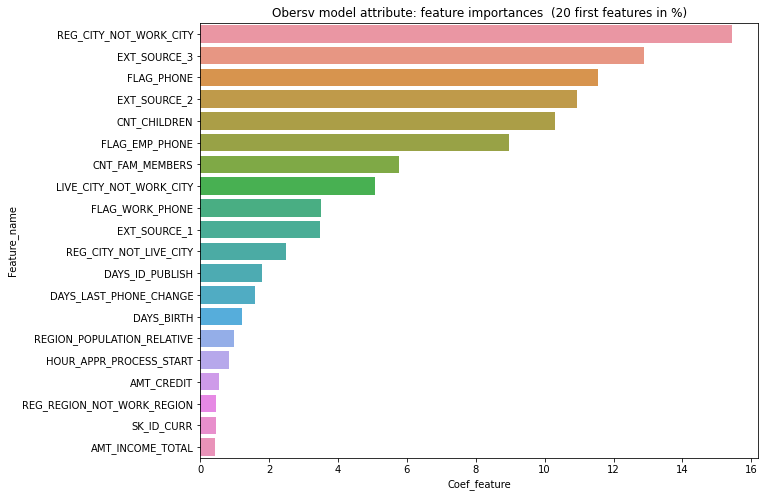

In [198]:
nbfeature=20

plt.figure(figsize=[10,8])
plt.title('Obersv model attribute: feature importances  ({} first features in %)'.format(nbfeature))
sns.barplot(x=(study_feature['Coef_feature']*100).head(nbfeature),y=study_feature['Feature_name'].head(nbfeature))

In [199]:
features_mvp = study_feature['Feature_name'].head(10).values.tolist()

In [200]:
with open(r'dashboard_resources\features_mvp.pickle', 'wb') as f:
    pickle.dump(features_mvp, f)

In [201]:
shap_features

['REG_CITY_NOT_WORK_CITY',
 'FLAG_PHONE',
 'CNT_CHILDREN',
 'EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_WORK_PHONE',
 'REG_CITY_NOT_LIVE_CITY',
 'CNT_FAM_MEMBERS',
 'FLAG_EMP_PHONE',
 'EXT_SOURCE_1',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_WORK_REGION',
 'SK_ID_CURR',
 'AMT_INCOME_TOTAL',
 'LIVE_REGION_NOT_WORK_REGION',
 'DAYS_REGISTRATION',
 'AMT_CREDIT',
 'FLAG_EMAIL',
 'AMT_ANNUITY',
 'REG_REGION_NOT_LIVE_REGION',
 'FLAG_CONT_MOBILE',
 'FLAG_MOBIL']